In [23]:
import numpy as np
import sklearn.datasets
import matplotlib.pyplot as plt
from src.SpectralClustering import SpectralClustering
from sklearn.metrics.cluster import adjusted_rand_score

In [24]:
k_tests   = np.linspace(0, 300, 100, dtype=int)
eps_tests = np.linspace(0, 1, 30)

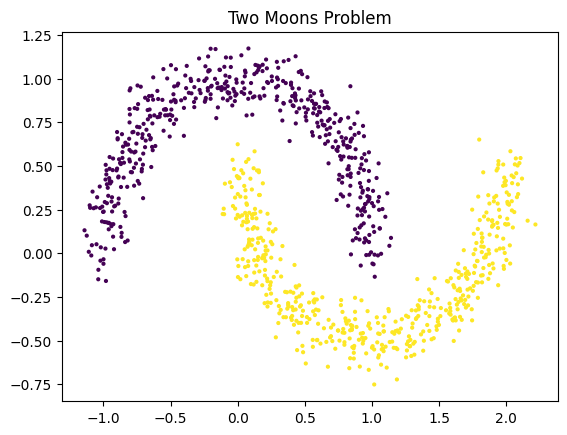

In [25]:
# generate the two moons problem

X, y_true = sklearn.datasets.make_moons(n_samples=1000, shuffle=False, noise=0.09, random_state=42)
plt.scatter(X[:,0], X[:,1], c=y_true, s=4)
plt.title('Two Moons Problem')
plt.show()

In [26]:
# helper method: quickly train model using config, get labels
def get_labels(refinement_method, eps = None, k = None):
    spec_model = SpectralClustering(2, refinement=refinement_method, k = k, eps = eps)
    spec_model.fit(X)
    y_pred = spec_model.labels_
    return y_pred

In [27]:
# calculate predictions for each of k and eps tests
k_predictions   = [get_labels('knn', k = k    ) for k   in k_tests  ]
eps_predictions = [get_labels('eps', eps = eps) for eps in eps_tests]

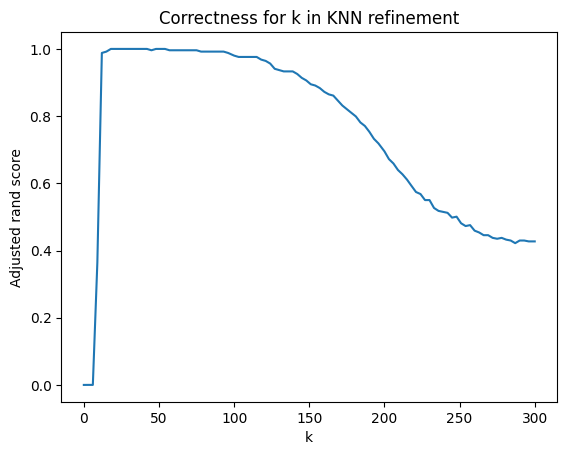

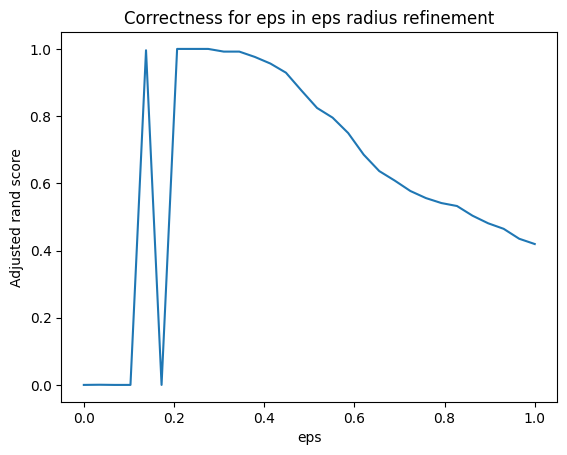

In [28]:
# generate scores and show as graph
k_scores   = [adjusted_rand_score(y_true, y_pred) for y_pred in k_predictions  ]
eps_scores = [adjusted_rand_score(y_true, y_pred) for y_pred in eps_predictions]

plt.title('Correctness for k in KNN refinement')
plt.xlabel('k')
plt.ylabel('Adjusted rand score')
plt.plot(k_tests, k_scores)
plt.show()

plt.title('Correctness for eps in eps radius refinement')
plt.xlabel('eps')
plt.ylabel('Adjusted rand score')
plt.plot(eps_tests, eps_scores)
plt.show()

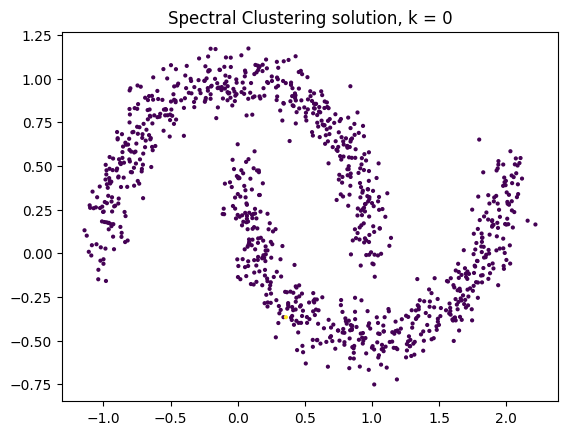

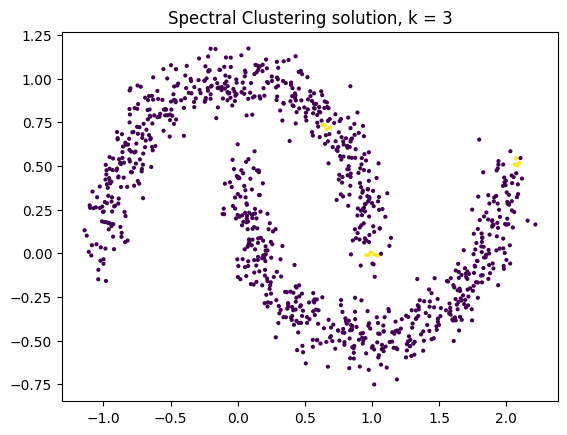

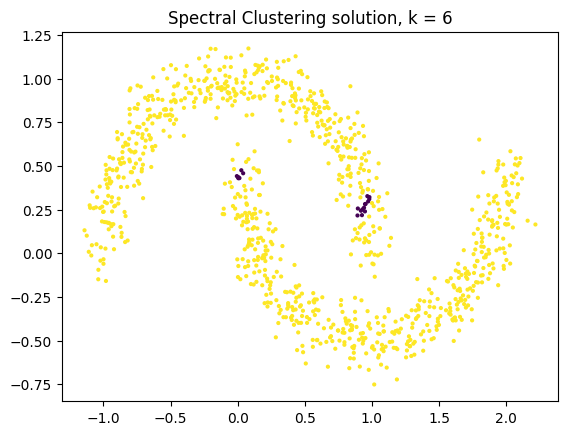

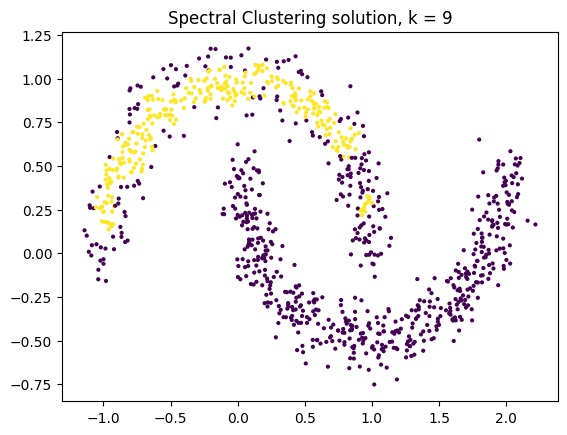

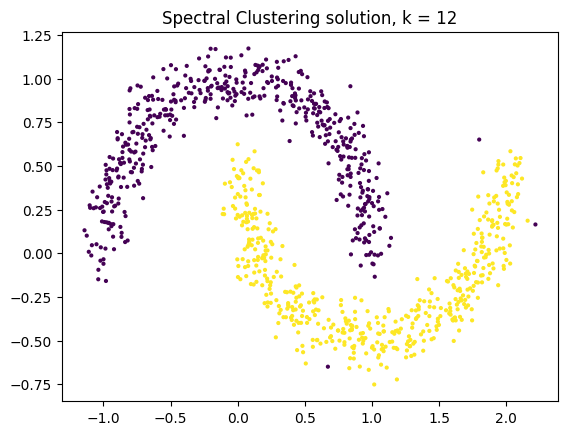

...

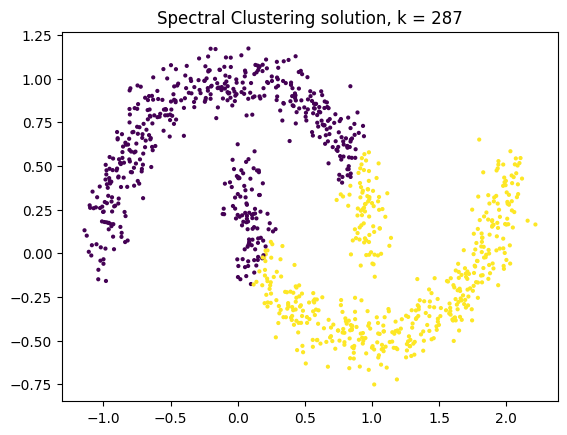

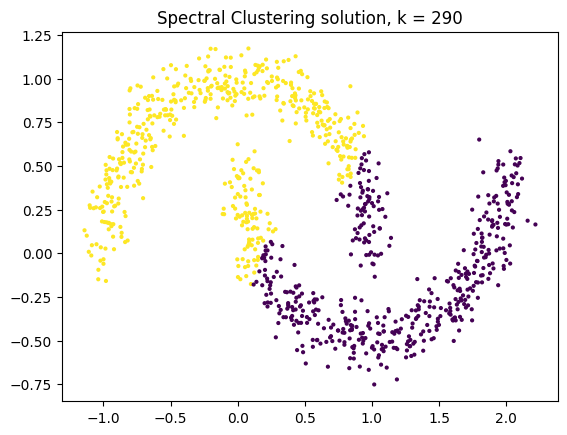

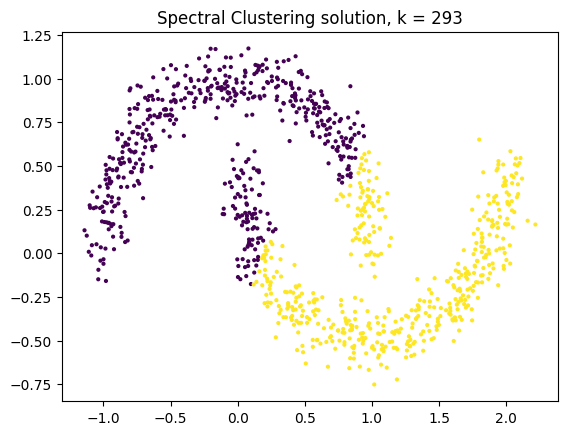

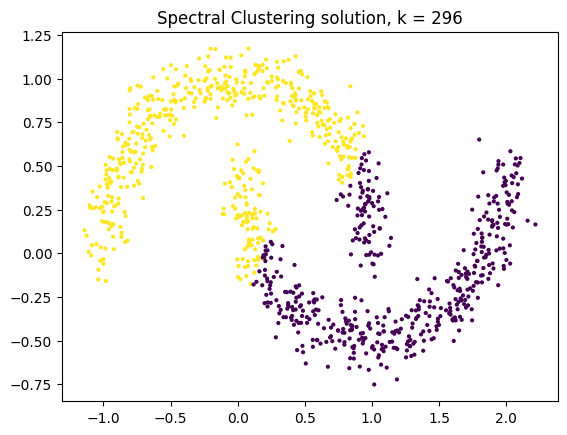

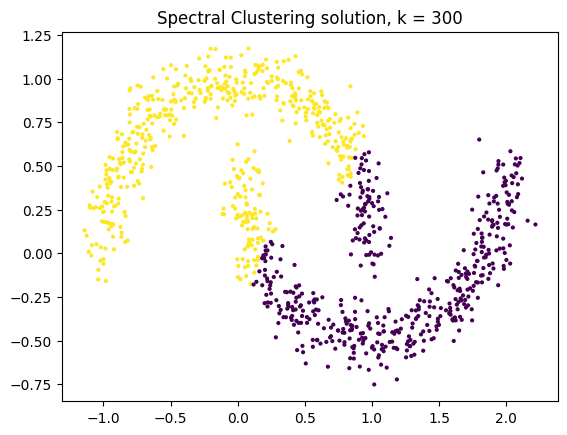

In [29]:
# show graphs for all knn predictions

for i, y_pred in enumerate(k_predictions):
    k = k_tests[i]
    plt.scatter(X[:,0], X[:,1], c=y_pred, s=4)
    plt.title(f'Spectral Clustering solution, k = {k}')
    plt.show()

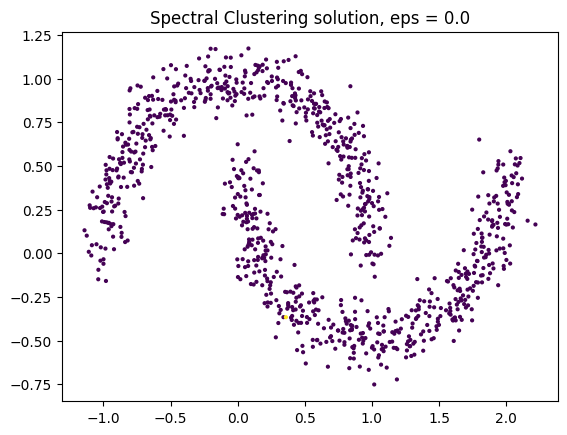

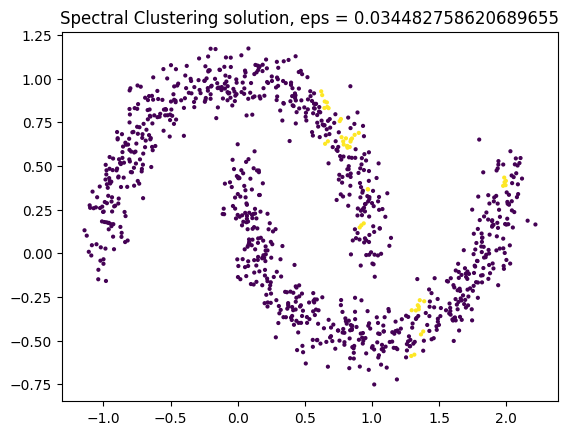

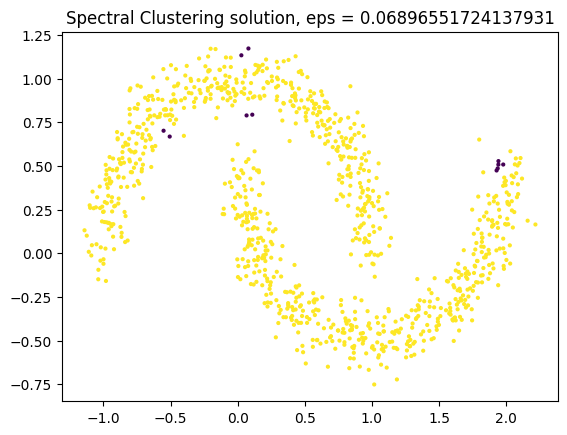

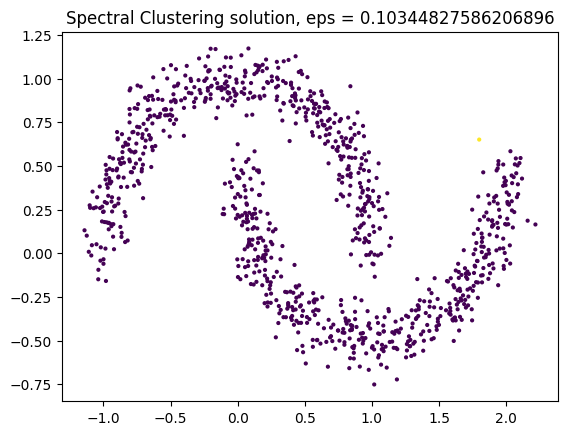

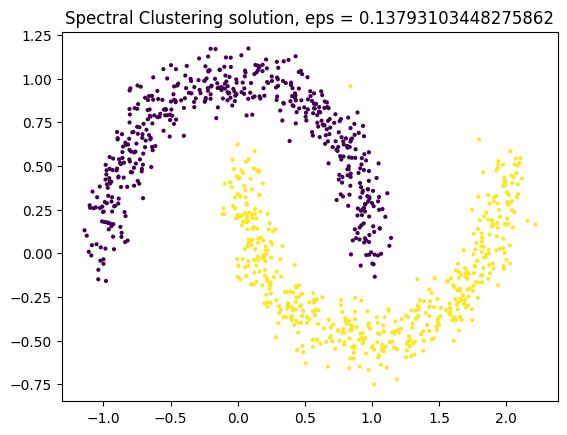

...

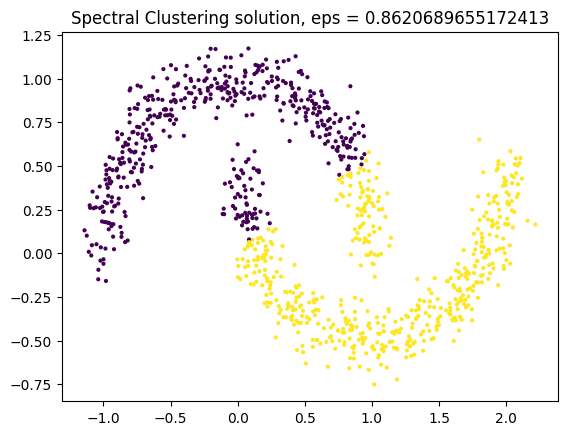

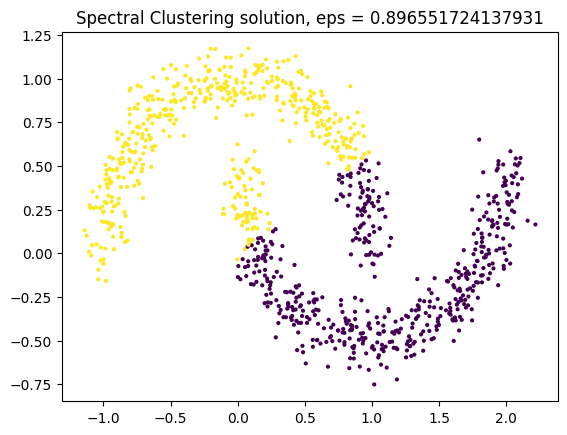

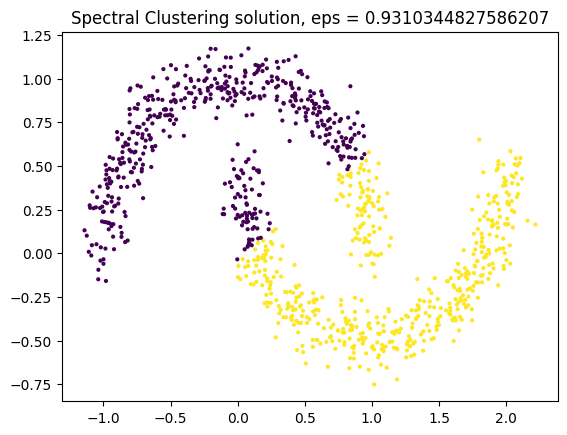

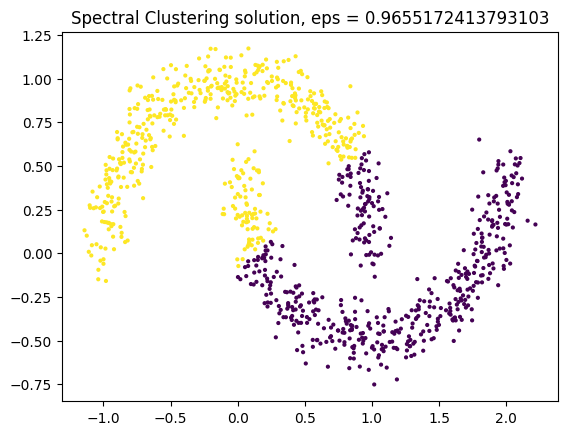

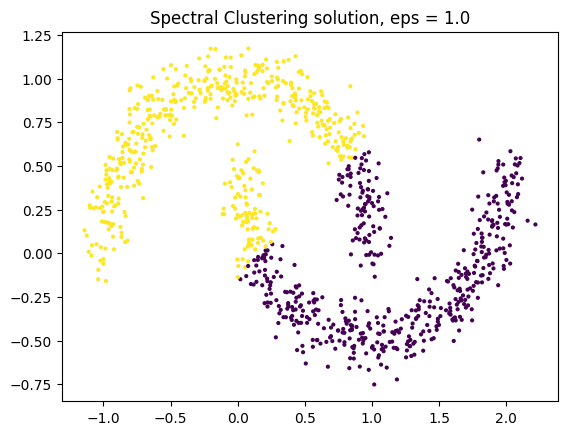

In [30]:
# show graphs for all eps predictions

for i, y_pred in enumerate(eps_predictions):
    eps = eps_tests[i]
    plt.scatter(X[:,0], X[:,1], c=y_pred, s=4)
    plt.title(f'Spectral Clustering solution, eps = {eps}')
    plt.show()